<a href="https://colab.research.google.com/github/zaidensarii/Dog-Vision/blob/main/Dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#!unzip "drive/MyDrive/Dog-Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/"

In [2]:
# End to End multi class dog breed classification

# This notebook builds an end to end multi-class image
# classifier using tensor flow 2.0 and tensor flow hub.


# Getting our workspace ready

In [3]:
# Importing necessary tools
import tensorflow as tf
import tensorflow_hub as hub
import pandas as pd
print("Tensor flow version:", tf.__version__ )
print("Tensor Flow hub verison:", hub.__version__)


# Checking for GPU availability
print("GPU", "available (YESSS)" if tf.config.list_physical_devices("GPU") else "Not available")

Tensor flow version: 2.15.0
Tensor Flow hub verison: 0.16.1
GPU Not available


# Getting our data ready ( Turning into tensors )

With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into tensors ( Numerical Representations).

In [4]:
labels_csv = pd.read_csv("drive/My Drive/Dog Vision/dog-breed-identification/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [5]:
labels_csv.tail()

,id,breed
10217,ffd25009d635cfd16e793503ac5edef0,borzoi
10218,ffd3f636f7f379c51ba3648a9ff8254f,dandie_dinmont
10219,ffe2ca6c940cddfee68fa3cc6c63213f,airedale
10220,ffe5f6d8e2bff356e9482a80a6e29aac,miniature_pinscher
10221,fff43b07992508bc822f33d8ffd902ae,chesapeake_bay_retriever


<Axes: >

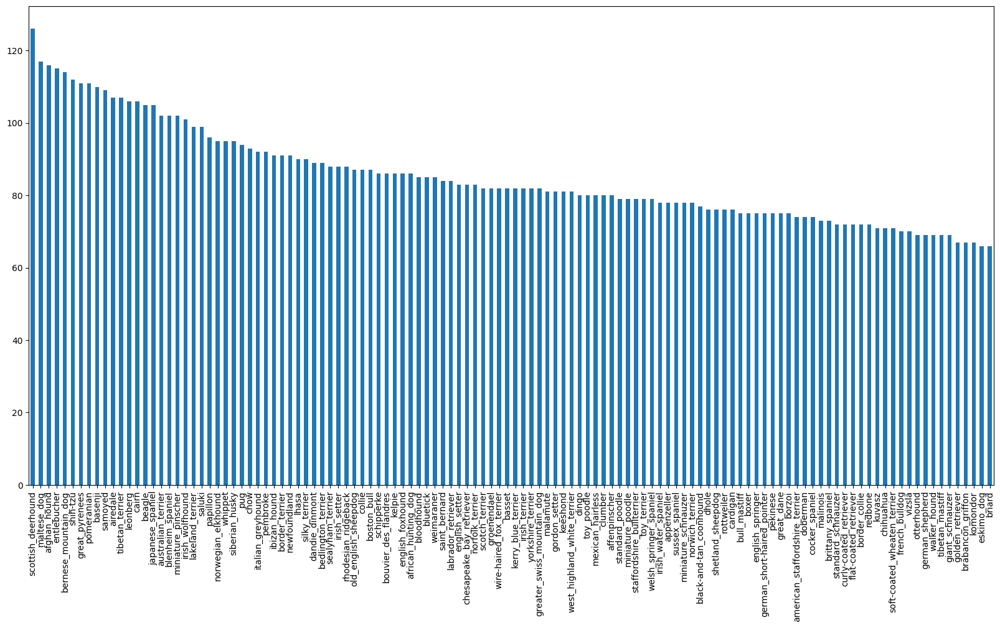

In [6]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

In [7]:
labels_csv["breed"].value_counts().median()

82.0

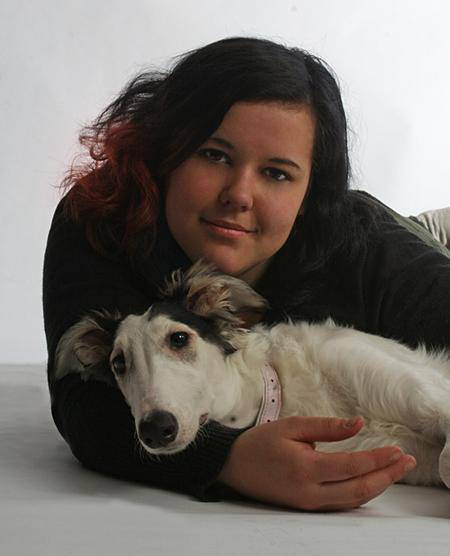

In [8]:
# Let's view an image

from IPython.display import Image
Image("drive/My Drive/Dog Vision/dog-breed-identification/train/ffd25009d635cfd16e793503ac5edef0.jpg")

In [9]:
### Getting images and their labels

#Let's get a list of all of our image pathnames.

In [10]:
# Create pathnames from image ID's
filenames = ["drive/My Drive/Dog Vision/dog-breed-identification/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['drive/My Drive/Dog Vision/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/dog-breed-identification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/dog-breed-identification/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [11]:
# check whether number of filenames matches number of actual image files.
import os
if len(os.listdir("drive/My Drive/Dog Vision/dog-breed-identification/train")) == len(filenames):
  print("Number of image files are equal")
else:
  print("Number of image files aren't equal")

Number of image files are equal


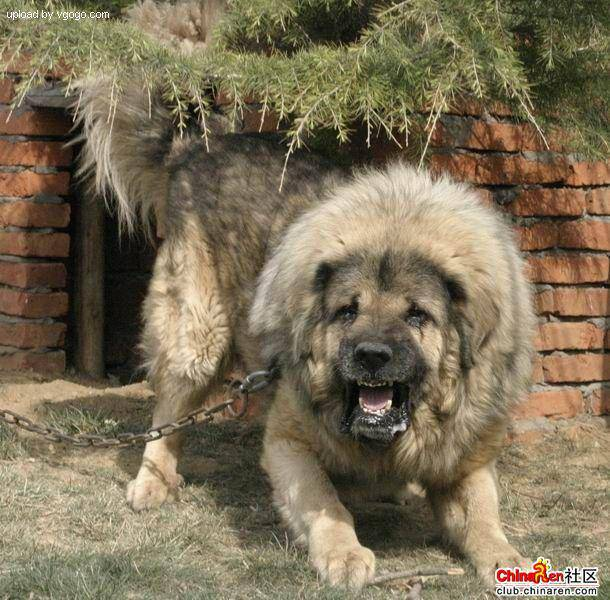

In [12]:
# One more check
from IPython.display import Image
Image(filenames[9000])

In [13]:
labels_csv["breed"][9000]

'tibetan_mastiff'

In [14]:
# Since we've now got our training image filepaths in a list, let's prepare our labels.
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [15]:
len(labels)

10222

In [16]:
# See if number of labels matches the number of file names

if len(labels) == len(filenames):
  print("Equal")
else:
  print("Not Equal")

Equal


In [17]:
# Find the unique label values

unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [18]:
len(unique_breeds)

120

In [19]:
# Turning a songle label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [20]:
# Turn every label into a boolean array

boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [21]:
# Turning boolean array into integers

print(labels[0])  # original labels
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [22]:
## Creating our own validation set

In [23]:
# Setup X & y variables

X = filenames
y = boolean_labels

In [24]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [25]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42
                                                  )

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [26]:
# Let's have a geez at the training data

X_train[:5], y_train[:2]

(['drive/My Drive/Dog Vision/dog-breed-identification/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/Dog Vision/dog-breed-identification/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/My Drive/Dog Vision/dog-breed-identification/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/My Drive/Dog Vision/dog-breed-identification/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/My Drive/Dog Vision/dog-breed-identification/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,


**Image Preprocessing ( Turning Images into tensors )**

To preprocess our images into Tensors we're going to write a function which does a few things:

1. Take an image filepath as input.
2. Use TensorFlow to read the file and save it to a variable `image`
3. Turn our image(a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1).
5. Resize the `image` to be shape of (224, 224)
6. Return the modified `image`


In [27]:
# Convert image to numpy array

from matplotlib.pyplot import imread
image = imread(filenames[9000])
image.shape

(600, 610, 3)

In [28]:
image[:2]

array([[[124, 129,  88],
        [150, 155, 114],
        [122, 127,  86],
        ...,
        [ 80,  85,  55],
        [ 66,  73,  40],
        [ 66,  73,  40]],

       [[144, 149, 108],
        [153, 158, 117],
        [121, 126,  85],
        ...,
        [ 58,  63,  33],
        [ 65,  72,  41],
        [ 65,  72,  39]]], dtype=uint8)

In [29]:
# turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 610, 3), dtype=uint8, numpy=
array([[[124, 129,  88],
        [150, 155, 114],
        [122, 127,  86],
        ...,
        [ 80,  85,  55],
        [ 66,  73,  40],
        [ 66,  73,  40]],

       [[144, 149, 108],
        [153, 158, 117],
        [121, 126,  85],
        ...,
        [ 58,  63,  33],
        [ 65,  72,  41],
        [ 65,  72,  39]]], dtype=uint8)>

In [30]:
# Define image size

IMG_SIZE = 224

# Creating a function for preprocessing images

def process_image(image_path, img_size=IMG_SIZE):

  # Reading an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # convert the color channel values from 0-255 to 0-1 values.
  image = tf.image.convert_image_dtype(image, tf.float16)
  # Resize the image to our desired value (244, 244)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

Turning the images into batches.

In order to use Tensor Flow effectively, we need our data in the form of tensor tuples which look like this:

`(image, labels)`

In [31]:
# Create a simple function to return a tuple (image, label)

def get_image_label(image_path, label):

  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label)
  """
  image = process_image(image_path)
  return image, label

In [32]:
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.326508  , 0.5221965 , 0.3232344 ],
         [0.2537375 , 0.44367617, 0.24115196],
         [0.2569776 , 0.4467719 , 0.23892087],
         ...,
         [0.29330826, 0.5189174 , 0.32151932],
         [0.29727745, 0.5245724 , 0.33023372],
         [0.29491943, 0.52221435, 0.33398193]],
 
        [[0.25896916, 0.4538538 , 0.27299517],
         [0.243777  , 0.44068936, 0.2554564 ],
         [0.28386524, 0.4721297 , 0.2829905 ],
         ...,
         [0.27842304, 0.50278825, 0.3100567 ],
         [0.28434372, 0.5108294 , 0.32518658],
         [0.28826004, 0.5147457 , 0.32910293]],
 
        [[0.20941609, 0.40698427, 0.25789452],
         [0.24047197, 0.43900353, 0.28682286],
         [0.28995404, 0.479402  , 0.3224384 ],
         ...,
         [0.2606986 , 0.4842096 , 0.3012957 ],
         [0.27093315, 0.49456596, 0.32092968],
         [0.27928463, 0.5029174 , 0.32928112]],
 
        ...,
 
        [[0.00634785, 0.03442416

In [33]:
# Now we have got a way to turn our data into tuples of tensors in the form: `(image, label)`, let's make a function to turn all of our data (X & Y)
# into batches.

In [34]:
BATCH_SIZE = 32

def create_data_batches(X, y= None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):

  if test_data:
    print("Creating test data batches....")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  elif valid_data:
    print("Creating the valid data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating the training data batches...")

    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))

    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling after mapping.
    data = data.shuffle(buffer_size=len(X))

    data = data.map(get_image_label)

    data_batch = data.batch(BATCH_SIZE)

    return data_batch


In [35]:
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating the training data batches...
Creating the valid data batches...


In [36]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

Visulaizing Data Batches

In [37]:
import matplotlib.pyplot as plt

def show_25_images(images, labels):
  plt.figure(figsize=(10,10))

  for i in range(25):

    ax = plt.subplot(5, 5, i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])

    plt.axis("off")

In [38]:
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels)

(32, 32)

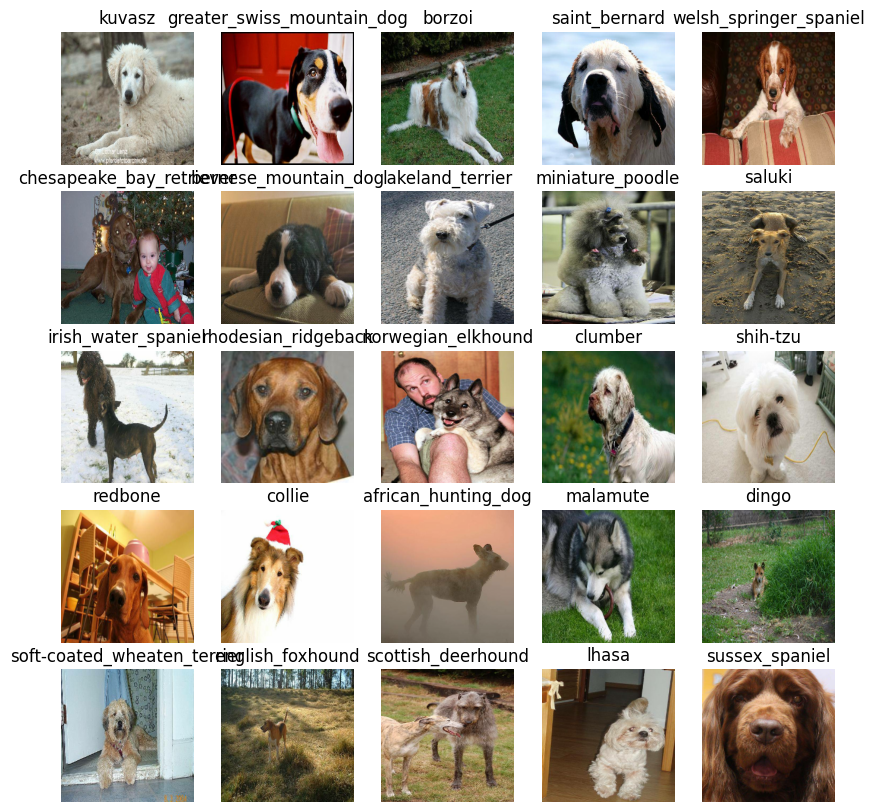

In [39]:
show_25_images(train_images, train_labels)

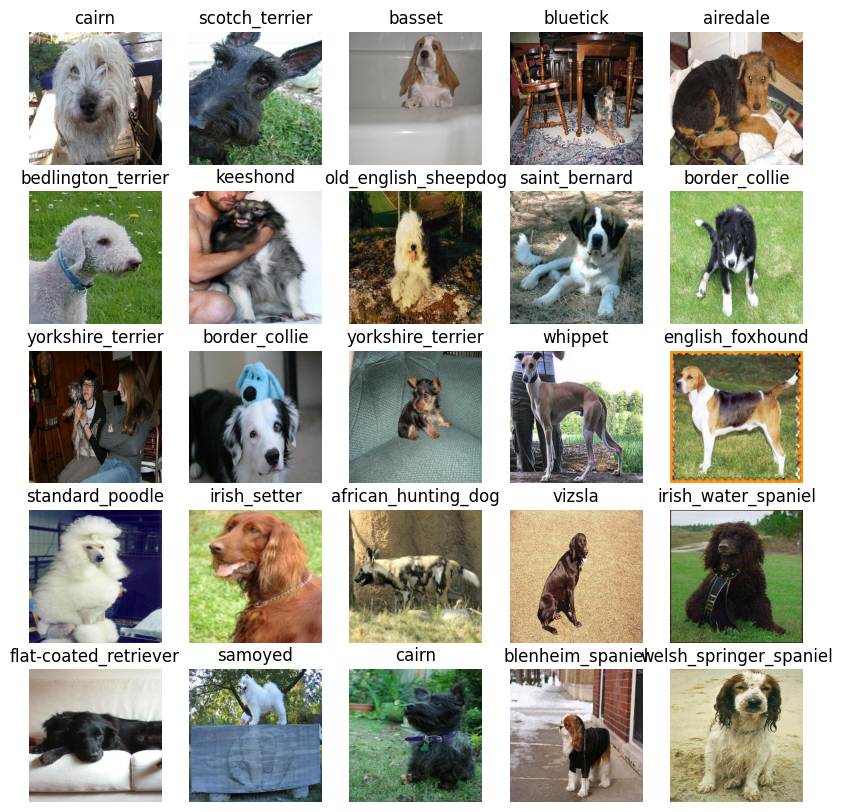

In [40]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

In [41]:
#  setup input shape to the model

INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]

#setup output shape of our model

OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub

MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/2"

Now we've got our inputs, outputs and model ready to go.
Let's put them together into a Keras Deep Learning model.


Knowing this, Let's create a function which:
* Takes the input shape, output shape and the model we,ve chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that)
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting)
* Returns the model.

In [42]:
import tensorflow as tf
from tensorflow import keras
import tensorflow_hub as hub

def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
    print("Building model with:", MODEL_URL)

    # Setup the model layers
    model = keras.Sequential([
        hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
        keras.layers.Dense(units=OUTPUT_SHAPE,
                           activation="softmax") # Layer 2 (output layer)
    ])

    # Compile the model
    model.compile(
        loss=keras.losses.CategoricalCrossentropy(),
        optimizer=keras.optimizers.Adam(),
        metrics=["Accuracy"]
    )

    # Build the model
    model.build(INPUT_SHAPE)

    return model


In [43]:
model = create_model()
model.summary()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/2
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


Callbacks are helper functions a model can use during training to do such things as save it's progress, check it's progress or stop training early if a model stops improving.

In [44]:
# Creating Callbacks
%load_ext tensorboard

In [45]:
import datetime

def create_tensorboard_callback():
  logdir = os.path.join("drive/My Drive/Dog Vision/dog-breed-identification/logs",
                        datetime.datetime.now().strftime("%Y%m%d-H%M%S"))

  return keras.callbacks.TensorBoard(logdir)

### Early Stoping call back

In [46]:
early_stopping = keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                               patience=3)

In [47]:
# Training a model (on subset of data)

NUM_EPOCHS = 16 # @param {type:"slider", min:0, max:100, step:1}

In [48]:
# Let's create a function that trains a model

def train_model():
  model = create_model()

  tensorboard = create_tensorboard_callback()

  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=(val_images, val_labels),
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  return model

In [49]:
#model = train_model()

In [50]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/dog-breed-identification/logs

<IPython.core.display.Javascript object>

Making and evaluating predictions using a trained model

In [51]:
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 256s 42s/step


array([[0.02147636, 0.00011158, 0.01657631, ..., 0.00020234, 0.00258018,
        0.00915886],
       [0.00551716, 0.00308622, 0.00157701, ..., 0.00275387, 0.00084388,
        0.00445947],
       [0.00256099, 0.0058542 , 0.00571161, ..., 0.00425462, 0.00372324,
        0.00952519],
       ...,
       [0.00960782, 0.00531383, 0.00054573, ..., 0.00118701, 0.01580563,
        0.01302825],
       [0.01221635, 0.00076501, 0.01204757, ..., 0.01544811, 0.0004315 ,
        0.00185136],
       [0.00483697, 0.00187028, 0.0071848 , ..., 0.02565554, 0.02532934,
        0.00049073]], dtype=float32)

In [52]:
np.sum(predictions[0])

1.0

In [53]:
index = 0
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max Index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]} ")

[2.14763563e-02 1.11583955e-04 1.65763106e-02 2.55013406e-02
 1.32184923e-01 5.04363328e-04 2.75717746e-03 1.03627192e-03
 5.88631199e-04 1.12154521e-02 4.85793746e-04 1.01480233e-02
 1.37850819e-02 7.96770770e-03 1.77864058e-04 3.33821811e-02
 4.58336398e-02 1.28890332e-02 4.15257760e-04 3.24760121e-03
 3.95002449e-03 6.87494059e-04 1.43384549e-03 8.03174451e-03
 5.69095509e-03 1.83694381e-02 4.36783023e-03 2.93687405e-03
 7.23995417e-02 6.13241270e-03 4.41086187e-04 6.40883250e-03
 4.70901345e-04 4.76535526e-04 2.97009535e-02 1.10780494e-03
 7.57021364e-04 2.18271068e-03 9.13626340e-04 5.43065043e-03
 1.51878386e-03 1.32364989e-03 7.37058057e-04 1.34839155e-02
 3.01529630e-03 1.01279258e-03 2.24477965e-02 1.20246429e-02
 1.39176268e-02 1.58772187e-03 3.72034684e-03 1.27114635e-03
 7.92048592e-03 2.41717454e-02 3.14122124e-04 1.00498712e-02
 5.15313447e-03 2.70470884e-03 9.84400045e-04 3.77559625e-02
 3.49243544e-03 6.20915275e-03 3.96372797e-03 3.22267297e-04
 9.05123074e-03 2.882275

In [55]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [58]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]

pred_label = get_pred_label(predictions[0])
pred_label

'american_staffordshire_terrier'

In [60]:
get_pred_label(labels_[0])

'cairn'

In [61]:
get_pred_label(predictions[0])

'american_staffordshire_terrier'

In [68]:
# create a function to unbatch a batch dataset
def unbatchify(data):
  images = []
  labels = []

  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels

val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29595405, 0.43282214, 0.30561996],
         [0.26631892, 0.3299626 , 0.22847019],
         [0.3143597 , 0.27698445, 0.2293489 ],
         ...,
         [0.7760412 , 0.82322717, 0.8099245 ],
         [0.8127149 , 0.8287165 , 0.84082836],
         [0.8211408 , 0.8265636 , 0.8424942 ]],
 
        [[0.23447604, 0.3160257 , 0.19545718],
         [0.3415729 , 0.36564004, 0.27232748],
         [0.45020348, 0.4011805 , 0.33963245],
         ...,
         [0.7663346 , 0.81321025, 0.8133044 ],
         [0.73050123, 0.7501197 , 0.7658506 ],
         [0.7452079 , 0.7599865 , 0.7829516 ]],
 
        [[0.30155587, 0.30828786, 0.21019094],
         [0.2906041 , 0.27059287, 0.18399207],
         [0.41377544, 0.36163038, 0.29633436],
         ...,
         [0.79855275, 0.8419829 , 0.8607003 ],
         [0.79559493, 0.82862693, 0.8606218 ],
         [0.7518092 , 0.7789362 , 0.8154757 ]],
 
        ...,
 
        [[0.9747768 , 0.98794276, 0.93415016],
         [0.99156356, 0.99772954, 0.94300

In [62]:
images_ = []
labels_ = []

# Loop through unbatched images
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[0.29595405, 0.43282214, 0.30561996],
         [0.26631892, 0.3299626 , 0.22847019],
         [0.3143597 , 0.27698445, 0.2293489 ],
         ...,
         [0.7760412 , 0.82322717, 0.8099245 ],
         [0.8127149 , 0.8287165 , 0.84082836],
         [0.8211408 , 0.8265636 , 0.8424942 ]],
 
        [[0.23447604, 0.3160257 , 0.19545718],
         [0.3415729 , 0.36564004, 0.27232748],
         [0.45020348, 0.4011805 , 0.33963245],
         ...,
         [0.7663346 , 0.81321025, 0.8133044 ],
         [0.73050123, 0.7501197 , 0.7658506 ],
         [0.7452079 , 0.7599865 , 0.7829516 ]],
 
        [[0.30155587, 0.30828786, 0.21019094],
         [0.2906041 , 0.27059287, 0.18399207],
         [0.41377544, 0.36163038, 0.29633436],
         ...,
         [0.79855275, 0.8419829 , 0.8607003 ],
         [0.79559493, 0.82862693, 0.8606218 ],
         [0.7518092 , 0.7789362 , 0.8154757 ]],
 
        ...,
 
        [[0.9747768 , 0.98794276, 0.93415016],
         [0.99156356, 0.99772954, 0.94300

In [64]:
get_pred_label(val_labels[0])

'cairn'

In [72]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  pred_label = get_pred_label(pred_prob)
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

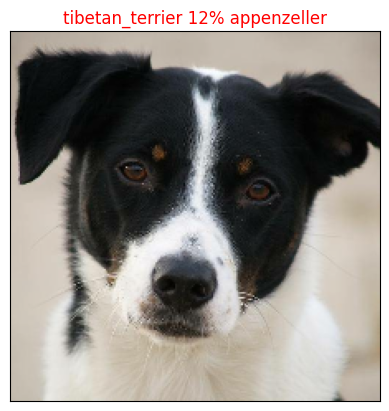

In [78]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=199)